In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import keras
from os import listdir
from sklearn.model_selection import train_test_split


Using TensorFlow backend.


In [2]:
##Reading two datasets(just copy the data sets in that folder)


input_address = 'D:/My Job/DataMining/Session2/Python/Data/input'
output_address = 'D:/My Job/DataMining/Session2/Python/Data/output'


names= listdir(input_address)
data = [pd.read_excel(input_address+'/' + i) for i in names]

In [3]:
#finding replicated columns


for i in data[0].columns:
    if i in data[1].columns:
        print(i)

Obs
AGEOTD
ACCTNO


In [27]:
##Merging the data

data2 = data[0].merge(data[1].drop(['Obs','AGEOTD'],axis=1),on='ACCTNO')
data2 = data2.drop('BAD',axis=1)
data2 = data2.set_index('Obs')

In [11]:
##Saving the merged data

# data2.to_excel(output_address+'/data2.xlsx')
# data2.head(10).to_excel(output_address+'/tenrec.xlsx')

In [12]:
data2.head(10)

,AGEOTD,AGEAVG,TRADES,TOTBAL,HSATRT,CURSAT,BRTRDS,BROPEN,BROLDT,BRHS2X,...,TIME39,TIME49,CSORAT,T2924X,T3924X,T4924X,BRBAL1,REHSAT,BKRETL,MODLYR
Obs,,,,,,,,,,,,,,,,,,,,,
1,-5,-5.00,0,-5,-5.00,-5,-5,-5,-5,-5,...,-5,-5,-5.0,-5,-5,-5,-5,-5,9925.0,1994
2,81,46.00,9,1567,0.00,0,0,-6,-6,-6,...,4,4,-6.0,4,4,4,-6,-6,9050.0,1993
3,-2,-2.00,0,-2,-2.00,-2,-2,-2,-2,-2,...,-2,-2,-2.0,-2,-2,-2,-2,-2,3165.0,1983
4,216,39.52,35,27657,37.14,1,3,1,23,0,...,2,2,100.0,7,7,6,1,8,3975.0,1989
5,107,30.44,13,11467,23.08,0,0,-6,-6,-6,...,8,8,-6.0,2,2,2,-6,0,21293.0,1998
6,-3,-3.00,0,-3,-3.00,-3,-3,-3,-3,-3,...,-3,-3,-3.0,-3,-3,-3,-3,-3,5600.0,1988
7,62,40.00,7,34027,0.00,0,1,0,62,0,...,5,5,-6.0,4,4,4,-6,-6,6775.0,1990
8,79,39.67,16,4920,6.25,1,0,-6,-6,-6,...,1,18,100.0,2,2,0,-6,1,5875.0,1990
9,69,13.00,6,19449,0.00,0,3,2,22,0,...,2,4,0.0,4,4,3,1,-6,10385.0,1992


In [16]:
data2.describe().T

,count,mean,std,min,25%,50%,75%,max
AGEOTD,14042.0,7.124185e+01,61.187529,-5.00,30.00,61.00,100.000,593.00
AGEAVG,14042.0,2.771488e+01,26.908365,-5.00,7.33,24.00,40.000,311.00
TRADES,14042.0,7.994588e+00,7.834998,0.00,2.00,6.00,11.000,101.00
TOTBAL,14042.0,1.317810e+04,28337.939413,-5.00,545.25,3713.00,13200.000,688869.00
HSATRT,14042.0,1.484629e+01,21.861330,-5.00,0.00,0.00,25.000,100.00
CURSAT,14042.0,4.453782e-01,1.973484,-5.00,0.00,0.00,1.000,27.00
BRTRDS,14042.0,8.435408e-01,2.366066,-5.00,0.00,0.00,2.000,25.00
BROPEN,14042.0,-2.643641e+00,3.236371,-6.00,-6.00,-3.00,0.000,10.00
BROLDT,14042.0,2.427354e+01,48.325992,-6.00,-6.00,-3.00,42.000,593.00
BRHS2X,14042.0,-2.894246e+00,2.911509,-6.00,-6.00,-3.00,0.000,5.00


In [17]:
sns.pairplot(data2)

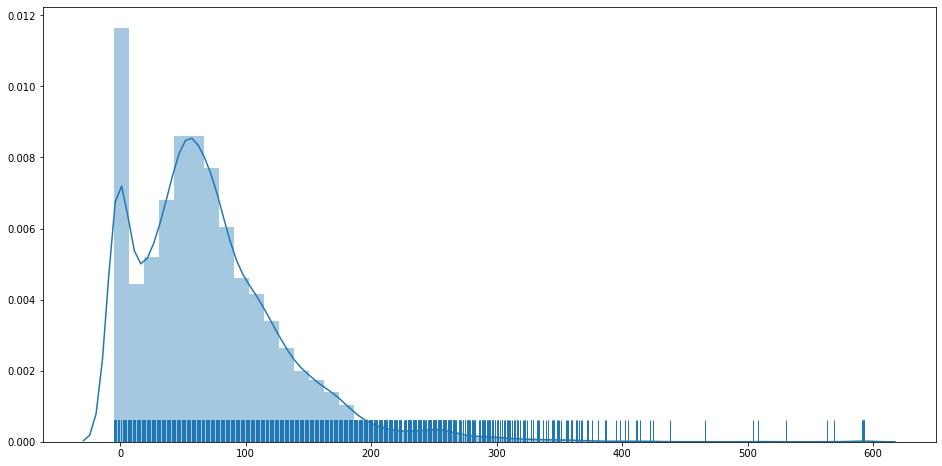

In [29]:
plt.figure(figsize=(16,8))
# plt.hist(data2['AGEOTD'],bins=20 ,rwidth=0.9);
sns.distplot(np.float64(data2['AGEOTD']),rug=True);

In [66]:
data2.columns

Index(['AGEOTD', 'AGEAVG', 'TRADES', 'TOTBAL', 'HSATRT', 'CURSAT', 'BRTRDS',
       'BROPEN', 'BROLDT', 'BRHS2X', 'BRHS3X', 'BRHS4X', 'BRHS5X', 'AUUTIL',
       'CFTRDS', 'INQ012', 'PUBREC', 'BKTIME', 'CBTYPE', 'ACCTNO', 'VAGE',
       'VRESMOS', 'VJOBMOS', 'VDDASAV', 'GOOD', 'TERM', 'DWNPMT', 'NTTRIN',
       'BSWHOL', 'BSRETL', 'MAKE', 'MODEL', 'MILEAG', 'NEWUSE', 'MNGPAY',
       'CONTPR', 'RVOLDT', 'TROP24', 'OREVTR', 'RVTRDS', 'ORVTB0', 'HST79X',
       'HST03X', 'TIME29', 'TIME39', 'TIME49', 'CSORAT', 'T2924X', 'T3924X',
       'T4924X', 'BRBAL1', 'REHSAT', 'BKRETL', 'MODLYR'],
      dtype='object')

In [ ]:
data2[data2.columns][data2[]]

In [34]:
##split data in train 50% and test 50%

X_train, X_test = train_test_split(data2, test_size=0.5, random_state=42)

In [1]:
#  Crosstabulate

def crosstab(data=X_train, attribute= 'AGEOTD', dependent_var='GOOD', lower_bound=85, upper_bound=95 ):
    
    all_count = data[dependent_var].count()
    total_good_count = data[dependent_var].sum()
    total_bad_count = all_count - total_good_count
    
    
    bucket_count = data[dependent_var][(data[attribute]>=lower_bound)&(data[attribute]<upper_bound)].count()
    good_count = data[dependent_var][(data[attribute]>=lower_bound)&(data[attribute]<upper_bound)].sum()    
    bad_count = bucket_count - good_count
    
    percentage = (bucket_count/all_count)*100
    good_portion = (good_count/total_good_count)*100
    bad_portion = (bad_count/total_bad_count)*100
    ratio_G_B = good_portion/bad_portion
     
    
    return (print(f"Data Included:\t\t{percentage.round(2)}%\nBAD_Count:\t\t{bad_count}\nBAD_percentage:\t\t{bad_portion.round(2)}%\
    \nGOOD_Count:\t\t{good_count}\nGOOD_percentage:\t{good_portion.round(2)}%\
    \nTotal:\t\t\t{bucket_count}\nRation G/B:\t\t{ratio_G_B.round(2)}\nTotal GOOD count:\t{total_good_count}\
    \nTotal BAD count:\t{total_bad_count}\nTotal_Total_count:\t{all_count}"))
    

NameError: name 'X_train' is not defined

In [20]:

crosstab(data=data2, attribute= 'AGEOTD', dependent_var='GOOD', lower_bound=85, upper_bound=95)


Data Included:		5.28%
BAD_Count:		220
BAD_percentage:		4.78%    
GOOD_Count:		522
GOOD_percentage:	5.53%    
Total:			742
Ration G/B:		1.16
Total GOOD count:	9442    
Total BAD count:	4600
Total_Total_count:	14042


In [39]:
#creating dummy+ creating new column

def dummy(data=X_train, attribute= 'AGEOTD', suffix=1, bucket_min=85, bucket_max=115):
   
    ###creating dummy
    
    ###
    data[attribute + str(suffix)]=0
    data[attribute + str(suffix)][(data[attribute]>=bucket_min) & (data[attribute]<bucket_max)] = 1
    
    return data.columns

In [62]:
dummy(data=X_train, attribute= 'VAGE', suffix=1, bucket_min=18, bucket_max=23)

C:\Users\s.m.mahmoodi\Anaconda3\envs\ztdl\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


TypeError: '>=' not supported between instances of 'str' and 'int'

In [63]:
# Remove the unnecessary columns

data_dum = data2.drop(['VJOBMOS','AGEOTD','TRADES','HST03X','MILEAG'],axis=1)

In [65]:
#Save Data warehouse
data_dum.to_excel(output_address + '/data_dum.xlsx')